In [31]:
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import statsmodels.api as sm
from tqdm import tqdm
from IPython.core.display import display, HTML
from tqdm import tnrange
from sklearn.manifold import TSNE
from pandas.plotting import register_matplotlib_converters
from sklearn.model_selection import cross_val_score
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from scipy.signal import argrelmax
register_matplotlib_converters()

In [2]:
sns.set()

In [3]:
fresh_df = pd.read_csv(r'fresh_format.csv', index_col='Unnamed: 0')

/Users/artem/anaconda3/lib/python3.7/site-packages/numpy/lib/arraysetops.py:568: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [4]:
fresh_df1 = pd.read_csv(r'fresh_format1.csv', index_col='Unnamed: 0')

In [5]:
fresh_df2 = pd.read_csv(r'fresh_format2.csv', index_col='Unnamed: 0')

In [6]:
fresh_df1.head(5)

,id,time,value
0,0,2017-08-28,0.838454
1,0,2017-09-04,-1.481446
2,0,2017-09-11,0.357031
3,0,2017-09-18,0.357031
4,0,2017-09-25,1.774945


In [7]:
fresh_df2.head(5)

,id,time,value
0,0,2018-08-27,1.211874
1,0,2018-09-03,-1.481446
2,0,2018-09-10,1.774945
3,0,2018-09-17,0.357031
4,0,2018-09-24,-0.321496


In [8]:
fresh_df1.shape,  fresh_df2.shape, 

((16835832, 3), (16835832, 3))

In [9]:
#Функция вычисления центроидов всех кластеров 
def centroids(data, clusters):
    n = np.unique(clusters)
    dist = []
    for i in n:
        matrix = data.values[np.where(clusters == i)]
        dist.append(np.sum(matrix, axis=0) / matrix.shape[0])
    return np.array(dist)

#Расстояние между цетроидами кластеров (на вход матрица цетроидов) 
def cluster_dist(matrix):
    size = matrix.shape[0]
    av_dist = [sum((euclid(matrix[i], matrix[j]) for j in range(i, size))) for i in range(size)]
    return sum(av_dist)/ len(av_dist)

#Функция вычисления среднего расстояния между кластерами  
av_dist = lambda df, cl: cluster_dist(centroids(df, cl))

#Евклидово расстояние
euclid = lambda x, y: np.sqrt(np.sum((x - y)**2))

In [10]:
def plot(*args):
    plt.figure(figsize=(20, 6))
    for arg in args:
        plt.plot(arg.T)
    plt.title('Data Example')
    plt.show()

def plot_clust(data, clusters, lines=100):
    centroid = centroids(data, clusters)
    n = np.unique(clusters)
    plt.figure(figsize=(20, 400))
    for i in n:
        plt.subplot(len(n), 1, i+1)
        plt.title(f'cluster {i}')
        idx = np.where(clusters == i)[0][:lines]
        plt.plot(data.columns, centroid[i], c='red')
        for i in idx:
            plt.plot(data.T.iloc[:, i], c='black', alpha=0.1)
            plt.plot()

In [11]:
def metrics_values(data, clusters):
    metrics = {'Average Distance': av_dist(data, clusters),
                'Silhouette score': silhouette_score(data, clusters),
                'Calinski-Harabasz score': calinski_harabasz_score(data, clusters),
                'Davies bouldin score': davies_bouldin_score(data, clusters)}
    return metrics
    

In [12]:
fresh_df['time'] = pd.to_datetime(fresh_df['time'])
fresh_df1['time'] = pd.to_datetime(fresh_df1['time'])
fresh_df2['time'] = pd.to_datetime(fresh_df2['time'])

In [13]:
fresh_df = fresh_df[:105 * 60000]
fresh_df1 = fresh_df1[:52 * 60000]
fresh_df2 = fresh_df2[:52 * 60000]

In [14]:
from tsfresh.feature_extraction import feature_calculators
from tsfresh.feature_extraction import extract_features, MinimalFCParameters
from tsfresh.utilities.distribution import MultiprocessingDistributor
from tsfresh.utilities.dataframe_functions import roll_time_series
from tsfresh import extract_relevant_features

# Feature `extraction`


##  lenear_trend
linear least-squares regression and return slope
$y_t = \beta_0 + \beta_1 x_t$  
slope - $\beta_1 $  
intercept - $\beta_0$


## skewness:

$ G_{1} = \frac{\sqrt{n(n-1)}}{n-2}
                 \frac{\frac{1}{n} \sum_{i=1}^{n}{(x_{i} - \bar{x})}}
                 {\sigma^{3}}  $

Skewness measures the lack of symmetry in a variable.

## kurtosis:
$
G_2 = \frac{\frac{1}{n}\sum_{i=1}^{n}(x_{i} - \bar{x})^{4}}
      {\sigma^{4}}  - 3
$


## fft_aggregated:

centroid:
* center of gravity (balancing point of the spectrum)  
* It determines the frequency area around which most of the signal energy concentrates  

variance:
* The variance is a measure of how far a set of
numbers is spread out. Describing how far the numbers
lie from the mean (expected value).

kurtosis:
* Kurtosis is a measure of the shape of
the probability distribution of a real-valued random
variable. It is closely related to the fourth moment of a
distribution. A high kurtosis distribution has longer, fatter
tails, and often (but not always) a sharper peak. A low
kurtosis distribution has shorter, thinner tails, and often
(but not always) a more rounded peak.

skew:
* Skewness - measure of the
asymmetry of the probability distribution of a real-valued
random variable. A negative skew indicates that the tail on the left side of the probability density function is longer than the right side and the bulk of the values (possibly
including the median) lie to the right of the mean. A
positive skew indicates that the tail on the right side is
longer than the left side and the bulk of the values lie to
the left of the mean. A zero value indicates that the
values are relatively evenly distributed on both sides of
the mean, typically but not necessarily implying a
symmetric distribution. 


Skewness is the degree of symmetry in the distribution of energy consumption data and
kurtosis measures how much a distribution is peaked at the center of a
distribution.
Many real world systems may contain chaotic behavior and especially nonlinear
dynamical systems often exhibit chaos, which is characterized by sensitive
dependence on initial values, or more precisely by a positive Lyapunov Exponent. LE, as a measure of the divergence of nearby trajectories has been used to qualifying chaos by giving a quantitative value. It is common to just refer to the
largest one, i.e. to the Maximal Lyapunov exponent (MLE), because it determines the
predictability of a dynamical system. A positive MLE is usually taken as an indication
that the system is chaotic. The maximal Lyapunov exponent (λ) can be defined using .

In [15]:
fc_param = {
#     'linear_trend': [{'attr': 'slope'}, {'attr': 'intercept'}],
    'autocorrelation': [{'lag': 1}, {'lag': 2}],

            
}
#     'spkt_welch_density': [{'coeff': 1}]
# # 'variance': None,
# # 'agg_autocorrelation': None,
#     'fft_aggregated': [{'aggtype': 'centroid'}, {'aggtype': 'variance'}, \
#                        {'aggtype': 'skew'}, {'aggtype': 'kurtosis'}],

In [16]:
fc_param1 = {
    'linear_trend': [{'attr': 'slope'}, {'attr': 'intercept'}],
    'skewness': None,
    'kurtosis': None,
    'fft_coefficient': [{'coeff':3, 'attr': 'abs'}, {'coeff':3, 'attr': 'angle'},\
                        {'coeff':2, 'attr': 'abs'}, {'coeff':2, 'attr': 'angle'},\
                        {'coeff':1, 'attr': 'abs'}, {'coeff':1, 'attr': 'angle'},
                        {'coeff':0, 'attr': 'abs'}, {'coeff':0, 'attr': 'angle'},],
#     'cwt_coefficients': [{'widths': range(1, 20), 'coeff': 1, 'w': 1}]
    
            
}

In [53]:
X = extract_features(fresh_df, column_id='id', column_sort='time',\
                  default_fc_parameters=fc_param1)




Feature Extraction:   0%|          | 0/10 [00:00<?, ?it/s]


Feature Extraction:  10%|█         | 1/10 [00:18<02:46, 18.54s/it]


Feature Extraction:  20%|██        | 2/10 [00:19<01:47, 13.41s/it]


Feature Extraction:  30%|███       | 3/10 [00:37<01:41, 14.52s/it]


Feature Extraction:  40%|████      | 4/10 [00:38<01:04, 10.69s/it]


Feature Extraction:  50%|█████     | 5/10 [00:54<01:00, 12.18s/it]


Feature Extraction:  60%|██████    | 6/10 [00:56<00:36,  9.07s/it]


Feature Extraction:  70%|███████   | 7/10 [01:11<00:33, 11.03s/it]


Feature Extraction:  80%|████████  | 8/10 [01:13<00:16,  8.25s/it]


Feature Extraction:  90%|█████████ | 9/10 [01:28<00:10, 10.20s/it]


Feature Extraction: 100%|██████████| 10/10 [01:29<00:00,  8.95s/it]


In [21]:
X1 = extract_features(fresh_df1, column_id='id', column_sort='time',\
                  default_fc_parameters=fc_param)


Feature Extraction: 100%|██████████| 10/10 [00:21<00:00,  2.13s/it]


In [22]:
X2 = extract_features(fresh_df2, column_id='id', column_sort='time',\
                  default_fc_parameters=fc_param)


Feature Extraction: 100%|██████████| 10/10 [00:27<00:00,  2.77s/it]


In [23]:
X1['value__autocorrelation__lag_1'] = X1['value__autocorrelation__lag_1'].fillna(X1['value__autocorrelation__lag_1'].median())
X2['value__autocorrelation__lag_1'] = X2['value__autocorrelation__lag_1'].fillna(X2['value__autocorrelation__lag_1'].median())
X1['value__autocorrelation__lag_2'] = X1['value__autocorrelation__lag_2'].fillna(X1['value__autocorrelation__lag_2'].median())
X2['value__autocorrelation__lag_2'] = X2['value__autocorrelation__lag_2'].fillna(X2['value__autocorrelation__lag_2'].median())

In [24]:
X['ratio_value__autocorrelation__lag_1'] = X1['value__autocorrelation__lag_1'] / X2['value__autocorrelation__lag_1']
X['ratio_value__autocorrelation__lag_1'] = X['ratio_value__autocorrelation__lag_1'].replace([np.inf, -np.inf], 0)
X['ratio_value__autocorrelation__lag_2'] = X1['value__autocorrelation__lag_2'] / X2['value__autocorrelation__lag_2']
X['ratio_value__autocorrelation__lag_2'] = X['ratio_value__autocorrelation__lag_2'].replace([np.inf, -np.inf], 0)
X1 = X1.drop('value__autocorrelation__lag_1', axis=1)
X2 = X2.drop('value__autocorrelation__lag_1', axis=1)
X1 = X1.drop('value__autocorrelation__lag_2', axis=1)
X2 = X2.drop('value__autocorrelation__lag_2', axis=1)

In [62]:
# X['ratio_value__linear_trend__attr_"intercept"'] = X1['value__linear_trend__attr_"intercept"'] / X2['value__linear_trend__attr_"intercept"']
# X['ratio_value__linear_trend__attr_"slope"'] = X1['value__linear_trend__attr_"slope"'] / X2['value__linear_trend__attr_"slope"']
# X['ratio_value__linear_trend__attr_"intercept"'] = X['ratio_value__linear_trend__attr_"intercept"'].replace([np.inf, -np.inf], 0)
# X['ratio_value__linear_trend__attr_"slope"'] = X['ratio_value__linear_trend__attr_"slope"'].replace([np.nan, np.inf, -np.inf], 0)
# X1 = X1.drop('value__linear_trend__attr_"intercept"', axis=1)
# X2 = X2.drop('value__linear_trend__attr_"slope"', axis=1)

In [63]:
# scale = StandardScaler()
# sc_X = pd.DataFrame(scale.fit_transform(X), index=X.index, columns=X.columns)
# scale = StandardScaler()
# sc_X1 = pd.DataFrame(scale.fit_transform(X1), index=X1.index, columns=X1.columns)
# scale = StandardScaler()
# sc_X2 = pd.DataFrame(scale.fit_transform(X2), index=X2.index, columns=X2.columns)

In [25]:
X2.columns = [i + '2' for i in X2.columns]
X.columns = [i + 'full' for i in X.columns]

# Extract holidays

In [35]:
df = pd.read_csv(r'st_ts.txt', index_col='id')
df.columns = pd.to_datetime(df.columns)
df = np.log(1.1 + df[:60000])
# scale = StandardScaler()
# sc_df = pd.DataFrame(scale.fit_transform(df).T, index=df.index, columns=df.columns)

ValueError: Shape of passed values is (105, 60000), indices imply (60000, 60000)

In [ ]:
sc_df

In [18]:
season = {
    'April': 'spring',
    'August': 'summer', 
    'December': 'winter', 
    'February': 'winter', 
    'January': 'winter', 
    'July': 'summer', 
    'June': 'summer',
    'March': 'spring', 
    'May': 'spring', 
    'November': 'autumn', 
    'October': 'autumn',
    'September': 'autumn'
}

In [19]:
df_temp = df.T.groupby(df.T.index.week, as_index=True, sort=False).sum()

In [20]:
# feat78 = [('2017-08-28', '2017-09-04'), ('2017-09-04', '2017-09-11'),
#           ('2017-12-04', '2017-12-11'),
#           ('2017-12-11', '2017-12-18'), ('2017-12-18', '2017-12-25'),
#           ('2017-12-25', '2018-01-01'), ('2018-01-01', '2018-01-08'),
#           ('2018-02-05', '2018-02-12'), ('2018-02-12', '2018-02-19'),
#           ('2018-02-19', '2018-02-26'), ('2018-03-05', '2018-03-12')]

In [21]:
# feat89 = [('2018-08-27', '2018-09-03'), ('2018-09-03', '2018-09-10'),
#           ('2018-12-03', '2018-12-10'), 
#           ('2018-12-10', '2018-12-17'), ('2018-12-17', '2018-12-24'),
#           ('2019-02-04','2019-02-11',), ('2018-02-12', '2018-02-19'),
#           ('2018-12-24', '2018-12-31'), ('2018-12-31', '2019-01-07'),
#           ('2019-02-18', '2019-02-25'), ('2019-03-04', '2019-03-11')]

In [22]:
df_ng = df_temp[(df_temp.index == 51) |\
        (df_temp.index == 52)].sum().divide(df_temp[(df_temp.index == 1)|\
                                                    (df_temp.index == 2)].sum()).replace([np.nan, np.inf, -np.inf], 0)
df_14f = df_temp[(df_temp.index == 5) |\
        (df_temp.index == 6)].sum().divide(df_temp[(df_temp.index == 7)|\
                                                    (df_temp.index == 8)].sum()).replace([np.nan, np.inf, -np.inf], 0)
df_23f = df_temp[(df_temp.index == 6) |\
        (df_temp.index == 7)].sum().divide(df_temp[(df_temp.index == 8)|\
                                                    (df_temp.index == 9)].sum()).replace([np.nan, np.inf, -np.inf], 0)
df_8m = df_temp[(df_temp.index == 8) |\
        (df_temp.index == 9)].sum().divide(df_temp[(df_temp.index == 10)|\
                                                    (df_temp.index ==11)].sum()).replace([np.nan, np.inf, -np.inf], 0)
df_1c = df_temp[(df_temp.index == 34) |\
        (df_temp.index == 35)].sum().divide(df_temp[(df_temp.index == 36)|\
                                                    (df_temp.index == 37)].sum()).replace([np.nan, np.inf, -np.inf], 0)

In [23]:
df_holid = pd.concat([df_ng, df_14f, df_23f, df_8m, df_1c], axis=1)
df_holid.columns = ['new_year', '14_f', '23_f', '8_m', '1_s'] 

In [24]:
df_12y = df.T.groupby(df.T.index.month_name(), as_index=True, sort=False).sum()
df_12y = df_12y.reset_index()
df_12y['index'] = df_12y['index'].replace(season)
df_12y = df_12y.groupby('index').sum()

In [25]:
df_wsu = pd.DataFrame({'winter_summer' :
                       df_12y.T['winter']
                       .divide(df_12y.T['summer'])
                       .replace([np.nan, np.inf, -np.inf], 0)})

In [26]:
df_holid = df_holid.merge(df_wsu, on='id')

In [27]:
df_holid

,new_year,14_f,23_f,8_m,1_s,winter_summer
id,,,,,,
0,3.403677,1.222828,1.452588,1.839442,1.439315,0.961738
1,0.000000,0.624044,1.859739,1.292481,0.000000,1.053221
2,1.000000,0.436209,1.528321,1.892789,0.000000,1.687010
3,0.000000,0.000000,0.000000,0.000000,0.278943,6.584963
4,0.000000,0.000000,0.000000,0.000000,1.261860,0.090909
...,...,...,...,...,...,...
34359739425,0.000000,0.000000,0.000000,0.000000,0.400000,0.561200
34359739426,0.000000,0.500000,1.000000,0.500000,0.500000,2.500000
34359739427,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000


In [28]:
scale = StandardScaler()
sc_feat = pd.DataFrame(scale.fit_transform(df_holid), index=df_holid.index, columns=df_holid.columns)

In [29]:
sc_feat

,new_year,14_f,23_f,8_m,1_s,winter_summer
id,,,,,,
0,2.337778,0.629118,0.830494,1.194984,0.332891,-0.166904
1,-0.869476,-0.183755,1.354560,0.540580,-0.883953,-0.109573
2,0.072815,-0.438748,0.927974,1.258811,-0.883953,0.287616
3,-0.869476,-1.030919,-1.039210,-1.005794,-0.648126,3.357115
4,-0.869476,-1.030919,-1.039210,-1.005794,0.182864,-0.712644
...,...,...,...,...,...,...
34359739425,-0.869476,-1.030919,-1.039210,-1.005794,-0.545780,-0.417917
34359739426,-0.869476,-0.352149,0.247944,-0.407575,-0.461237,0.797109
34359739427,-0.869476,-1.030919,-1.039210,-1.005794,-0.038520,-0.142926


In [34]:
# new_feat1 = [(log_df[i[1]] / log_df[i[0]]) for i in feat78]
# new_feat2 = [(log_df[i[1]] / log_df[i[0]]) for i in feat89]

In [ ]:
# df_feat = pd.DataFrame(new_feat1 + new_feat2, columns=sc_df.index).T.replace([np.nan, np.inf, -np.inf], 0)

In [ ]:
# ff = []
# for i in range(len(log_df.columns) // 2):
#     ff.append((log_df[log_df.columns[i]] + log_df[log_df.columns[i + 52]]) / 2)
# avfeat = pd.DataFrame(ff).T
# features = []
# for i in range(len(avfeat.columns) - 1):
#     features.append(avfeat[avfeat.columns[i+1]] / avfeat[avfeat.columns[i]])
# features = pd.DataFrame(features).T
# features = pd.DataFrame(features, index=features.index, columns=features.columns)
# features = features.replace([np.nan, np.inf, -np.inf], 0)

# Merge

In [39]:
dffeat = X1.join(X2)

In [40]:
full_dffeat = dffeat.join(X)

In [41]:
full_dffeat = pd.DataFrame(scale.fit_transform(full_dffeat), index=full_dffeat.index, columns=full_dffeat.columns)

In [42]:
full_dffeat

,"value__cwt_coefficients__widths_(1, 2, 3)__coeff_1__w_1full","value__fft_coefficient__coeff_0__attr_""abs""full","value__fft_coefficient__coeff_0__attr_""angle""full","value__fft_coefficient__coeff_1__attr_""abs""full","value__fft_coefficient__coeff_1__attr_""angle""full","value__fft_coefficient__coeff_2__attr_""abs""full","value__fft_coefficient__coeff_2__attr_""angle""full","value__fft_coefficient__coeff_3__attr_""abs""full","value__fft_coefficient__coeff_3__attr_""angle""full",value__kurtosisfull,"value__linear_trend__attr_""intercept""full","value__linear_trend__attr_""slope""full",value__skewnessfull,ratio_value__autocorrelation__lag_1full,ratio_value__autocorrelation__lag_2full
id,,,,,,,,,,,,,,,
0,-0.516757,0.478667,-0.784932,-0.694121,0.969016,-0.970588,0.866875,-0.396558,-1.697055,-0.443722,0.223947,-0.223947,-0.769650,0.017692,-0.004083
1,-0.517652,-0.193676,1.273996,-0.618735,0.822784,-1.062756,-1.641732,-1.731666,1.597894,-0.364872,0.046242,-0.046242,-0.336898,-0.007268,-0.004083
2,-0.371605,-0.287057,-0.784932,-0.497530,-1.888219,-0.527463,-1.003891,-0.777601,-0.052027,-0.346869,0.890655,-0.890655,-0.122100,-0.005299,-0.004083
3,0.579299,-0.716610,-0.784932,-1.395320,-0.950221,-0.463684,-0.770339,-1.586913,-0.866322,1.090626,0.977007,-0.977007,1.392355,0.001728,-0.004083
4,-1.832211,-0.623229,1.273996,0.818282,-0.091044,1.161236,0.302917,1.540231,0.258103,-0.000997,-0.679444,0.679444,0.583645,0.001512,-0.004083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34359739425,0.240100,-0.324410,-0.784932,0.049750,-1.393202,0.222577,-0.172562,-0.564457,-1.579530,-0.269162,1.756659,-1.756659,0.048863,-0.001598,-0.004083
34359739426,2.724273,-0.305734,-0.784932,-0.727944,-1.083879,0.075180,-0.608524,-0.948283,-0.297927,-0.286803,1.559993,-1.559993,0.122340,-0.002330,-0.004083
34359739427,3.898865,-0.791315,-0.784932,-1.321080,0.789439,-1.128355,-0.179287,-0.674022,-0.786657,2.560176,0.612022,-0.612022,2.491824,0.015774,-0.004083


In [43]:
new_dffeat = sc_feat.join(full_dffeat)

# Clustering

1     10556
32     5741
12     3039
39     2830
20     2803
38     2604
36     2211
10     2181
37     1939
24     1824
22     1679
0      1601
30     1597
6      1554
33     1342
13     1290
29     1224
8      1169
31     1146
18     1102
28     1086
15      929
3       918
21      806
2       697
19      673
4       651
7       582
26      555
14      544
9       533
5       530
23      517
11      350
27      294
34      251
16      219
25      216
35      118
17       99
dtype: int64


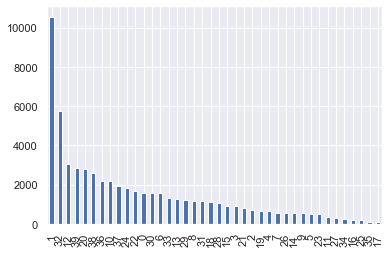

CPU times: user 677 ms, sys: 107 ms, total: 784 ms
Wall time: 19.4 s


In [30]:
%%time
clusters = pd.Series(KMeans(n_clusters=40, random_state=42, n_jobs = -1).fit_predict(sc_feat.drop('winter_summer', axis=1)), index = sc_df.index)

print(pd.Series(clusters).value_counts())
clusters.value_counts().plot.bar()
plt.show()

CPU times: user 7.59 s, sys: 366 ms, total: 7.96 s
Wall time: 8.65 s


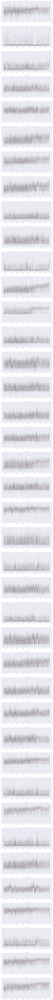

In [51]:
%%time
plot_clust(sc_df, clusters, 40)

In [61]:
%%time
print(metrics_values(sc_df, clusters))

{'Average Distance': 59.654368435522045, 'Silhouette score': -0.03375174378399871, 'Calinski-Harabasz score': 69.77690275550532, 'Davies bouldin score': 15.463836936171925}
CPU times: user 1min 13s, sys: 12.2 s, total: 1min 25s
Wall time: 1min 16s


only dates {'Average Distance': 59.654368435522045, 'Silhouette score': -0.03375174378399871, 'Calinski-Harabasz score': 69.77690275550532, 'Davies bouldin score': 15.463836936171925}

